In [1]:
!pip install pandas
!pip install folium==0.8.2
!pip install matplotlib
!pip install plotly
import plotly.graph_objects as go

In [2]:
import pandas
import folium
from folium.plugins import MarkerCluster
import numpy as np
import matplotlib.pyplot as plt

In [3]:
csv = 'dataset_v01.csv'
df = pandas.read_csv(csv , decimal=",")
df.head()

,id,dat_nsc,renda,latitude,longitude,idade,produtos,count_renda,count_idade,count_produtos
0,9e1480f9-22f3-4f0f-ad3b-6c79024a2b77,1900-01-01 00:00:00,"DE R$ 788,00 A R$ 1.140,00",-10.401944,-65.326667,acima de 90,COBRANÇA E RECUPERAÇÃO,3197,352,2427
1,247eb5dd-9fe6-46f9-a1c6-03ee63df864d,1909-05-05 00:00:00,"DE R$ 1.900,00 A R$ 3.800,00",-21.130993,-42.355504,acima de 90,COBRANÇA E RECUPERAÇÃO,4762,352,2427
2,28fa29b7-6154-4c05-815c-d4c6f5f292a2,1911-01-02 00:00:00,"DE R$ 788,00 A R$ 1.140,00",-18.772388,-42.929381,acima de 90,COBRANÇA E RECUPERAÇÃO,3197,352,2427
3,c60da0e8-ff59-4519-bc81-151b260f263c,1911-05-06 00:00:00,"DE R$ 788,00 A R$ 1.140,00",NaN,NaN,acima de 90,COBRANÇA E RECUPERAÇÃO,3197,352,2427
4,d83918c5-4baa-4b9d-885d-3820e3bcc91a,1913-03-15 00:00:00,"DE R$ 788,00 A R$ 1.140,00",-18.755000,-40.890833,acima de 90,COBRANÇA E RECUPERAÇÃO,3197,352,2427


In [5]:
from folium.plugins import HeatMap
df=df.dropna(subset=['renda'])
df=df.dropna(subset=['idade'])
df=df.dropna(subset=['longitude'])
df=df.dropna(subset=['latitude'])
df=df.dropna(subset=['produtos'])
df=df.dropna(subset=['count_produtos'])
df=df.dropna(subset=['count_idade'])
df=df.dropna(subset=['count_renda'])
lat = df.latitude.tolist()
lng = df.longitude.tolist()
renda = df.renda.tolist()
idade = df.idade.tolist()
produtos = df.produtos.tolist()
count_produtos = df.count_produtos.tolist()
count_idade = df.count_idade.tolist()
count_renda = df.count_renda.tolist()

m = folium.Map(
    location=[-5.7793, -35.2009],
    tiles='cartodbdark_matter',
    zoom_start=11
)

HeatMap(list(zip(lat, lng))).add_to(m)
m

In [23]:
from folium.plugins import MarkerCluster

m = folium.Map(
    location=[-5.7793, -35.2009],
    tiles='cartodbdark_matter',
    zoom_start=11
)
mc = MarkerCluster()
    
for index, creche in df.iterrows():
  mc.add_child(folium.Marker([creche['latitude'], creche['longitude']], 
              popup=str(creche['produtos']),
              icon=folium.Icon(icon='book'))).add_to(m)
m

Text(0, 0.5, 'produtos')

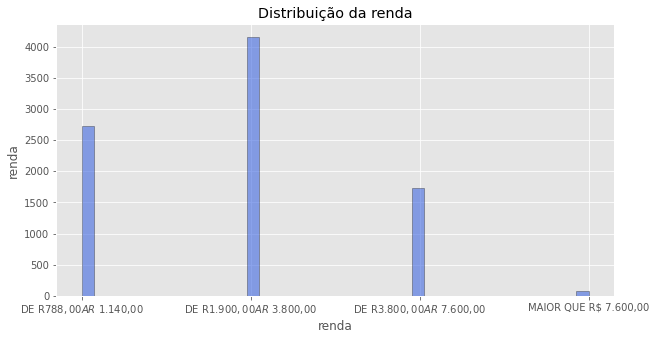

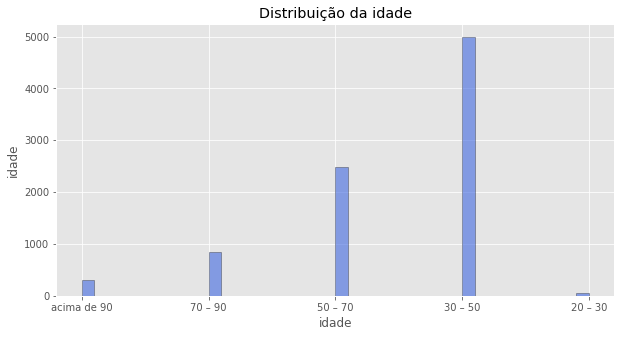

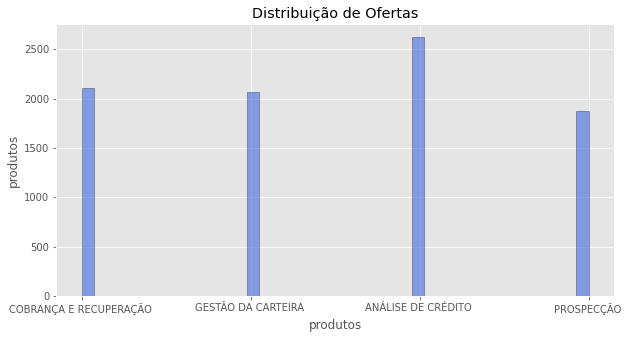

In [7]:
plt.style.use("ggplot")
plt.figure(figsize = (10, 5))
df["renda"].hist(bins = 40, ec = "k", alpha = .6, color = "royalblue")
plt.title("Distribuição da renda")
plt.xlabel("renda")
plt.ylabel("renda")
plt.style.use("ggplot")
plt.figure(figsize = (10, 5))
df["idade"].hist(bins = 40, ec = "k", alpha = .6, color = "royalblue")
plt.title("Distribuição da idade")
plt.xlabel("idade")
plt.ylabel("idade")
plt.style.use("ggplot")
plt.figure(figsize = (10, 5))
df["produtos"].hist(bins = 40, ec = "k", alpha = .6, color = "royalblue")
plt.title("Distribuição de Ofertas")
plt.xlabel("produtos")
plt.ylabel("produtos")

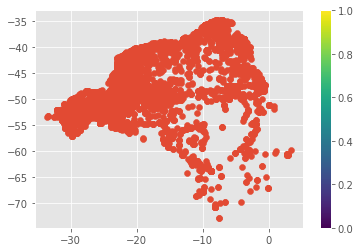

In [8]:
plt.scatter(lat, lng)
plt.colorbar()
plt.show()

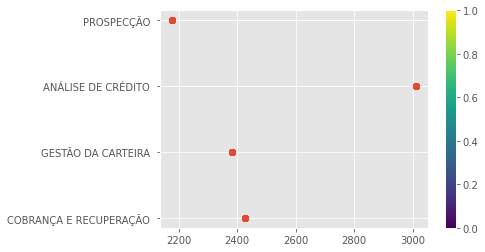

In [16]:
plt.scatter(count_produtos, produtos)
plt.colorbar()
plt.show()

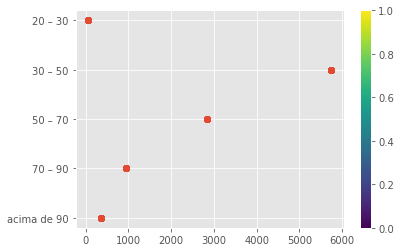

In [17]:
plt.scatter(count_idade, idade)
plt.colorbar()
plt.show()

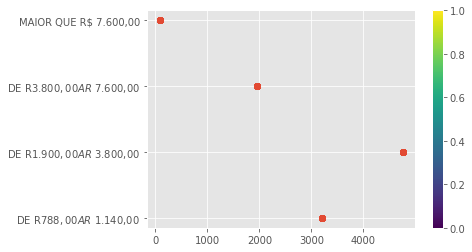

In [18]:
plt.scatter(count_renda, renda)
plt.colorbar()
plt.show()

In [22]:
scl = [0,"rgb(150,0,90)"],[0.125,"rgb(0, 0, 200)"],[0.25,"rgb(0, 25, 255)"],\
[0.375,"rgb(0, 152, 255)"],[0.5,"rgb(44, 255, 150)"],[0.625,"rgb(151, 255, 0)"],\
[0.75,"rgb(255, 234, 0)"],[0.875,"rgb(255, 111, 0)"],[1,"rgb(255, 0, 0)"]

fig = go.Figure(data=go.Scattergeo(
        lon = df['longitude'],
        lat = df['latitude'],
        text = df['produtos'],
        marker = dict(
            size = 8,
            opacity = 0.8,
            reversescale = True,
            autocolorscale = False,
            line = dict(
                width=1,
                color='rgba(102, 102, 102)'
            ),
            cmin = 0,
            colorscale = scl,    
        )))

fig.update_layout(
        title = 'OFERTAS',
geo = dict(
        scope = 'south america',
        showland = True,
        landcolor = "rgb(212, 212, 212)",
        subunitcolor = "rgb(255, 255, 255)",
        countrycolor = "rgb(255, 255, 255)",
        showlakes = True,
        lakecolor = "rgb(255, 255, 255)",
        showsubunits = True,
        showcountries = True,
        resolution = 50,
        projection = dict(
            type = 'conic conformal',
            rotation_lon = -100
        ),
        lonaxis = dict(
            showgrid = True,
            gridwidth = 0.5,
            dtick = 5
        ),
        lataxis = dict (
            showgrid = True,
            gridwidth = 0.5,
            dtick = 5
        )
    ),
)
fig.show()
